<a href="https://colab.research.google.com/github/caiobaptistaa/Econometria-4_PUC-Rio/blob/main/Trabalho_1_Quest_1_PC_Analysis_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1> Trabalho 1 - (Questão 1) - Caio Baptista <h1>

<h4> (a) (30 points) Compute the principal components of the returns and determine the optimal
number of principal factors by one the methods described in Lecture 2. How much of the
variance will the factors be able to explain? <h4>
   
<h4> (b) (30 points) Regress the selected factors on the 16 observed anomaly factors described
above. How do the  principal component factors relate to the anomaly factors? <h4>
    
<h4> (c) (30 points) Now, run a principal component analysis on the 16 anomaly factors and
select the optimal number of principal components using the same criterion adopted in
the first item of the exercise. By inspecting the principal eigenvectors can you identify a
dominating anomaly? <h4>
    
<h4> (d) (30 points) How do the anomaly-based principal factors related to the return-based
principal factors? <h4>

<h3> Answers <h3>

<h4> (a) <h4>

In [ ]:
import pandas as pd
pd.pandas.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

import seaborn as sns

import statsmodels.api as sm

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
data = pd.read_csv('/content/drive/MyDrive/Trabalho-1/returns.csv', sep= ";", low_memory= False)

Mounted at /content/drive


In [ ]:
data.head()

,dates,MKT,HML,SMB,MOM1,MOM36,ACC,BETA,CFP,CHCSHO,DY,EP,IDIOVOL,CMA,UMD,RMW,RETVOL,r_ 1,r_ 2,r_ 3,r_ 4,r_ 5,r_ 6,r_ 7,r_ 8,r_ 9,r_ 10,r_ 11,r_ 12,r_ 13,r_ 14,r_ 15,r_ 16,r_ 17,r_ 18,r_ 19,r_ 20,r_ 21,r_ 22,r_ 23,r_ 24,r_ 25,r_ 26,r_ 27,r_ 28,r_ 29,r_ 30,r_ 31,r_ 32,r_ 33,r_ 34,r_ 35,r_ 36,r_ 37,r_ 38,r_ 39,r_ 40,r_ 41,r_ 42,r_ 43,r_ 44,r_ 45,r_ 46,r_ 47,r_ 48,r_ 49,r_ 50,r_ 51,r_ 52,r_ 53,r_ 54,r_ 55,r_ 56,r_ 57,r_ 58,r_ 59,r_ 60,r_ 61,r_ 62,r_ 63,r_ 64,r_ 65,r_ 66,r_ 67,r_ 68,r_ 69,r_ 70,r_ 71,r_ 72,r_ 73,r_ 74,r_ 75,r_ 76,r_ 77,r_ 78,r_ 79,r_ 80,r_ 81,r_ 82,r_ 83,r_ 84,r_ 85,r_ 86,r_ 87,r_ 88,r_ 89,r_ 90,r_ 91,r_ 92,r_ 93,r_ 94,r_ 95,r_ 96,r_ 97,r_ 98,r_ 99,r_ 100,r_ 101,r_ 102,r_ 103,r_ 104,r_ 105,r_ 106,r_ 107,r_ 108,r_ 109,r_ 110,r_ 111,r_ 112,r_ 113,r_ 114,r_ 115,r_ 116,r_ 117,r_ 118,r_ 119,r_ 120,r_ 121,r_ 122,r_ 123,r_ 124,r_ 125,r_ 126,r_ 127,r_ 128,r_ 129,r_ 130,r_ 131,r_ 132,r_ 133,r_ 134,r_ 135,r_ 136,r_ 137,r_ 138,r_ 139,r_ 140,r_ 141,r_ 142,r_ 143,r_ 144,r_ 145,r_ 146,r_ 147,r_ 148,r_ 149,r_ 150,r_ 151,r_ 152,r_ 153,r_ 154,r_ 155,r_ 156,r_ 157,r_ 158,r_ 159,r_ 160,r_ 161,r_ 162,r_ 163,r_ 164,r_ 165,r_ 166,r_ 167,r_ 168,r_ 169,r_ 170,r_ 171,r_ 172,r_ 173,r_ 174,r_ 175,r_ 176,r_ 177,r_ 178,r_ 179,r_ 180,r_ 181,r_ 182,r_ 183,r_ 184,r_ 185,r_ 186,r_ 187,r_ 188,r_ 189,r_ 190,r_ 191,r_ 192,r_ 193,r_ 194,r_ 195,r_ 196,r_ 197,r_ 198,r_ 199,r_ 200,r_ 201,r_ 202,r_ 203,r_ 204,r_ 205,r_ 206,r_ 207,r_ 208,r_ 209,r_ 210,r_ 211,r_ 212,r_ 213,r_ 214,r_ 215,r_ 216,r_ 217,r_ 218,r_ 219,r_ 220,r_ 221,r_ 222,r_ 223,r_ 224,r_ 225,r_ 226,r_ 227,r_ 228,r_ 229,r_ 230,r_ 231,r_ 232,r_ 233,r_ 234,r_ 235,r_ 236,r_ 237,r_ 238,r_ 239,r_ 240,r_ 241,r_ 242,r_ 243,r_ 244,r_ 245,r_ 246,r_ 247,r_ 248,r_ 249,r_ 250,r_ 251,r_ 252,r_ 253,r_ 254,r_ 255,r_ 256,r_ 257,r_ 258,r_ 259,r_ 260,r_ 261,r_ 262,r_ 263,r_ 264,r_ 265,r_ 266,r_ 267,r_ 268,r_ 269,r_ 270,r_ 271,r_ 272,r_ 273,r_ 274,r_ 275,r_ 276,r_ 277,r_ 278,r_ 279,r_ 280,r_ 281,r_ 282,r_ 283,r_ 284,r_ 285,r_ 286,r_ 287,r_ 288,r_ 289,r_ 290,r_ 291,r_ 292,r_ 293,r_ 294,r_ 295,r_ 296,r_ 297,r_ 298,r_ 299,r_ 300,r_ 301,r_ 302,r_ 303,r_ 304,r_ 305,r_ 306,r_ 307,r_ 308,r_ 309,r_ 310,r_ 311,r_ 312,r_ 313,r_ 314,r_ 315,r_ 316,r_ 317,r_ 318,r_ 319,r_ 320,r_ 321,r_ 322,r_ 323,r_ 324,r_ 325,r_ 326,r_ 327,r_ 328,r_ 329,r_ 330,r_ 331,r_ 332,r_ 333,r_ 334,r_ 335,r_ 336,r_ 337,r_ 338,r_ 339,r_ 340,r_ 341,r_ 342,r_ 343,r_ 344,r_ 345,r_ 346,r_ 347,r_ 348,r_ 349,r_ 350,r_ 351,r_ 352,r_ 353,r_ 354,r_ 355,r_ 356,r_ 357,r_ 358,r_ 359,r_ 360,r_ 361,r_ 362,r_ 363,r_ 364,r_ 365,r_ 366,r_ 367,r_ 368,r_ 369,r_ 370,r_ 371,r_ 372,r_ 373,r_ 374,r_ 375,r_ 376,r_ 377,r_ 378,r_ 379,r_ 380,r_ 381,r_ 382,r_ 383,r_ 384,r_ 385,r_ 386,r_ 387,r_ 388,r_ 389,r_ 390,r_ 391,r_ 392,r_ 393,r_ 394,r_ 395,r_ 396,r_ 397,r_ 398,r_ 399,r_ 400,r_ 401,r_ 402,r_ 403,r_ 404,r_ 405,r_ 406,r_ 407,r_ 408,r_ 409,r_ 410,r_ 411,r_ 412,r_ 413,r_ 414,r_ 415,r_ 416,r_ 417,r_ 418,r_ 419,r_ 420,r_ 421,r_ 422,r_ 423,r_ 424,r_ 425,r_ 426,r_ 427,r_ 428,r_ 429,r_ 430,r_ 431,r_ 432,r_ 433,r_ 434,r_ 435,r_ 436,r_ 437,r_ 438,r_ 439,r_ 440,r_ 441,r_ 442,r_ 443,r_ 444,r_ 445,r_ 446,r_ 447,r_ 448,r_ 449,r_ 450,r_ 451,r_ 452,r_ 453,r_ 454,r_ 455,r_ 456,r_ 457,r_ 458,r_ 459,r_ 460,r_ 461,r_ 462,r_ 463,r_ 464,r_ 465,r_ 466,r_ 467,r_ 468,r_ 469,r_ 470,r_ 471,r_ 472,r_ 473,r_ 474,r_ 475,r_ 476,r_ 477,r_ 478,r_ 479,r_ 480,r_ 481,r_ 482,r_ 483,r_ 484,r_ 485,r_ 486,r_ 487,r_ 488,r_ 489,r_ 490,r_ 491,r_ 492,r_ 493,r_ 494,r_ 495,r_ 496,r_ 497,r_ 498,r_ 499,r_ 500,r_ 501,r_ 502,r_ 503,r_ 504,r_ 505,r_ 506,r_ 507,r_ 508,r_ 509,r_ 510,r_ 511,r_ 512,r_ 513,r_ 514,r_ 515,r_ 516,r_ 517,r_ 518,r_ 519,r_ 520,r_ 521,r_ 522,r_ 523,r_ 524,r_ 525,r_ 526,r_ 527,r_ 528,r_ 529,r_ 530,r_ 531,r_ 532,r_ 533,r_ 534,r_ 535,r_ 536,r_ 537,r_ 538,r_ 539,r_ 540,r_ 541,r_ 542,r_ 543,r_ 544,r_ 545,r_ 546,r_ 547,r_ 548,r_ 549,r_ 550,r_ 551,r_ 552,r_ 553,r_ 554,r_ 555,r_ 556,r_ 557,r_ 558,r_ 559,r_ 560,r_ 561,r_ 562,r_ 563,r_ 564,r_ 565,r_ 566,r_ 567,r_ 568,r_ 569,r_ 570,r_ 571,r_ 572,r_ 573,r_ 574,r_ 575,

In [ ]:
data.shape

(326, 9473)

In [ ]:
data.dtypes

dates     object
MKT       object
HML       object
SMB       object
MOM1      object
           ...  
r_9452    object
r_9453    object
r_9454    object
r_9455    object
r_9456    object
Length: 9473, dtype: object

In [ ]:
data = data.apply(lambda x: x.str.replace(",", "."))
data.head()

,dates,MKT,HML,SMB,MOM1,MOM36,ACC,BETA,CFP,CHCSHO,DY,EP,IDIOVOL,CMA,UMD,RMW,RETVOL,r_ 1,r_ 2,r_ 3,r_ 4,r_ 5,r_ 6,r_ 7,r_ 8,r_ 9,r_ 10,r_ 11,r_ 12,r_ 13,r_ 14,r_ 15,r_ 16,r_ 17,r_ 18,r_ 19,r_ 20,r_ 21,r_ 22,r_ 23,r_ 24,r_ 25,r_ 26,r_ 27,r_ 28,r_ 29,r_ 30,r_ 31,r_ 32,r_ 33,r_ 34,r_ 35,r_ 36,r_ 37,r_ 38,r_ 39,r_ 40,r_ 41,r_ 42,r_ 43,r_ 44,r_ 45,r_ 46,r_ 47,r_ 48,r_ 49,r_ 50,r_ 51,r_ 52,r_ 53,r_ 54,r_ 55,r_ 56,r_ 57,r_ 58,r_ 59,r_ 60,r_ 61,r_ 62,r_ 63,r_ 64,r_ 65,r_ 66,r_ 67,r_ 68,r_ 69,r_ 70,r_ 71,r_ 72,r_ 73,r_ 74,r_ 75,r_ 76,r_ 77,r_ 78,r_ 79,r_ 80,r_ 81,r_ 82,r_ 83,r_ 84,r_ 85,r_ 86,r_ 87,r_ 88,r_ 89,r_ 90,r_ 91,r_ 92,r_ 93,r_ 94,r_ 95,r_ 96,r_ 97,r_ 98,r_ 99,r_ 100,r_ 101,r_ 102,r_ 103,r_ 104,r_ 105,r_ 106,r_ 107,r_ 108,r_ 109,r_ 110,r_ 111,r_ 112,r_ 113,r_ 114,r_ 115,r_ 116,r_ 117,r_ 118,r_ 119,r_ 120,r_ 121,r_ 122,r_ 123,r_ 124,r_ 125,r_ 126,r_ 127,r_ 128,r_ 129,r_ 130,r_ 131,r_ 132,r_ 133,r_ 134,r_ 135,r_ 136,r_ 137,r_ 138,r_ 139,r_ 140,r_ 141,r_ 142,r_ 143,r_ 144,r_ 145,r_ 146,r_ 147,r_ 148,r_ 149,r_ 150,r_ 151,r_ 152,r_ 153,r_ 154,r_ 155,r_ 156,r_ 157,r_ 158,r_ 159,r_ 160,r_ 161,r_ 162,r_ 163,r_ 164,r_ 165,r_ 166,r_ 167,r_ 168,r_ 169,r_ 170,r_ 171,r_ 172,r_ 173,r_ 174,r_ 175,r_ 176,r_ 177,r_ 178,r_ 179,r_ 180,r_ 181,r_ 182,r_ 183,r_ 184,r_ 185,r_ 186,r_ 187,r_ 188,r_ 189,r_ 190,r_ 191,r_ 192,r_ 193,r_ 194,r_ 195,r_ 196,r_ 197,r_ 198,r_ 199,r_ 200,r_ 201,r_ 202,r_ 203,r_ 204,r_ 205,r_ 206,r_ 207,r_ 208,r_ 209,r_ 210,r_ 211,r_ 212,r_ 213,r_ 214,r_ 215,r_ 216,r_ 217,r_ 218,r_ 219,r_ 220,r_ 221,r_ 222,r_ 223,r_ 224,r_ 225,r_ 226,r_ 227,r_ 228,r_ 229,r_ 230,r_ 231,r_ 232,r_ 233,r_ 234,r_ 235,r_ 236,r_ 237,r_ 238,r_ 239,r_ 240,r_ 241,r_ 242,r_ 243,r_ 244,r_ 245,r_ 246,r_ 247,r_ 248,r_ 249,r_ 250,r_ 251,r_ 252,r_ 253,r_ 254,r_ 255,r_ 256,r_ 257,r_ 258,r_ 259,r_ 260,r_ 261,r_ 262,r_ 263,r_ 264,r_ 265,r_ 266,r_ 267,r_ 268,r_ 269,r_ 270,r_ 271,r_ 272,r_ 273,r_ 274,r_ 275,r_ 276,r_ 277,r_ 278,r_ 279,r_ 280,r_ 281,r_ 282,r_ 283,r_ 284,r_ 285,r_ 286,r_ 287,r_ 288,r_ 289,r_ 290,r_ 291,r_ 292,r_ 293,r_ 294,r_ 295,r_ 296,r_ 297,r_ 298,r_ 299,r_ 300,r_ 301,r_ 302,r_ 303,r_ 304,r_ 305,r_ 306,r_ 307,r_ 308,r_ 309,r_ 310,r_ 311,r_ 312,r_ 313,r_ 314,r_ 315,r_ 316,r_ 317,r_ 318,r_ 319,r_ 320,r_ 321,r_ 322,r_ 323,r_ 324,r_ 325,r_ 326,r_ 327,r_ 328,r_ 329,r_ 330,r_ 331,r_ 332,r_ 333,r_ 334,r_ 335,r_ 336,r_ 337,r_ 338,r_ 339,r_ 340,r_ 341,r_ 342,r_ 343,r_ 344,r_ 345,r_ 346,r_ 347,r_ 348,r_ 349,r_ 350,r_ 351,r_ 352,r_ 353,r_ 354,r_ 355,r_ 356,r_ 357,r_ 358,r_ 359,r_ 360,r_ 361,r_ 362,r_ 363,r_ 364,r_ 365,r_ 366,r_ 367,r_ 368,r_ 369,r_ 370,r_ 371,r_ 372,r_ 373,r_ 374,r_ 375,r_ 376,r_ 377,r_ 378,r_ 379,r_ 380,r_ 381,r_ 382,r_ 383,r_ 384,r_ 385,r_ 386,r_ 387,r_ 388,r_ 389,r_ 390,r_ 391,r_ 392,r_ 393,r_ 394,r_ 395,r_ 396,r_ 397,r_ 398,r_ 399,r_ 400,r_ 401,r_ 402,r_ 403,r_ 404,r_ 405,r_ 406,r_ 407,r_ 408,r_ 409,r_ 410,r_ 411,r_ 412,r_ 413,r_ 414,r_ 415,r_ 416,r_ 417,r_ 418,r_ 419,r_ 420,r_ 421,r_ 422,r_ 423,r_ 424,r_ 425,r_ 426,r_ 427,r_ 428,r_ 429,r_ 430,r_ 431,r_ 432,r_ 433,r_ 434,r_ 435,r_ 436,r_ 437,r_ 438,r_ 439,r_ 440,r_ 441,r_ 442,r_ 443,r_ 444,r_ 445,r_ 446,r_ 447,r_ 448,r_ 449,r_ 450,r_ 451,r_ 452,r_ 453,r_ 454,r_ 455,r_ 456,r_ 457,r_ 458,r_ 459,r_ 460,r_ 461,r_ 462,r_ 463,r_ 464,r_ 465,r_ 466,r_ 467,r_ 468,r_ 469,r_ 470,r_ 471,r_ 472,r_ 473,r_ 474,r_ 475,r_ 476,r_ 477,r_ 478,r_ 479,r_ 480,r_ 481,r_ 482,r_ 483,r_ 484,r_ 485,r_ 486,r_ 487,r_ 488,r_ 489,r_ 490,r_ 491,r_ 492,r_ 493,r_ 494,r_ 495,r_ 496,r_ 497,r_ 498,r_ 499,r_ 500,r_ 501,r_ 502,r_ 503,r_ 504,r_ 505,r_ 506,r_ 507,r_ 508,r_ 509,r_ 510,r_ 511,r_ 512,r_ 513,r_ 514,r_ 515,r_ 516,r_ 517,r_ 518,r_ 519,r_ 520,r_ 521,r_ 522,r_ 523,r_ 524,r_ 525,r_ 526,r_ 527,r_ 528,r_ 529,r_ 530,r_ 531,r_ 532,r_ 533,r_ 534,r_ 535,r_ 536,r_ 537,r_ 538,r_ 539,r_ 540,r_ 541,r_ 542,r_ 543,r_ 544,r_ 545,r_ 546,r_ 547,r_ 548,r_ 549,r_ 550,r_ 551,r_ 552,r_ 553,r_ 554,r_ 555,r_ 556,r_ 557,r_ 558,r_ 559,r_ 560,r_ 561,r_ 562,r_ 563,r_ 564,r_ 565,r_ 566,r_ 567,r_ 568,r_ 569,r_ 570,r_ 571,r_ 572,r_ 573,r_ 574,r_ 575,

In [ ]:
data[data.columns[1:9473]] = data.iloc[:, 1:9473].astype(float)

In [ ]:
data.dtypes

dates      object
MKT       float64
HML       float64
SMB       float64
MOM1      float64
           ...   
r_9452    float64
r_9453    float64
r_9454    float64
r_9455    float64
r_9456    float64
Length: 9473, dtype: object

In [ ]:
data.head()

,dates,MKT,HML,SMB,MOM1,MOM36,ACC,BETA,CFP,CHCSHO,DY,EP,IDIOVOL,CMA,UMD,RMW,RETVOL,r_ 1,r_ 2,r_ 3,r_ 4,r_ 5,r_ 6,r_ 7,r_ 8,r_ 9,r_ 10,r_ 11,r_ 12,r_ 13,r_ 14,r_ 15,r_ 16,r_ 17,r_ 18,r_ 19,r_ 20,r_ 21,r_ 22,r_ 23,r_ 24,r_ 25,r_ 26,r_ 27,r_ 28,r_ 29,r_ 30,r_ 31,r_ 32,r_ 33,r_ 34,r_ 35,r_ 36,r_ 37,r_ 38,r_ 39,r_ 40,r_ 41,r_ 42,r_ 43,r_ 44,r_ 45,r_ 46,r_ 47,r_ 48,r_ 49,r_ 50,r_ 51,r_ 52,r_ 53,r_ 54,r_ 55,r_ 56,r_ 57,r_ 58,r_ 59,r_ 60,r_ 61,r_ 62,r_ 63,r_ 64,r_ 65,r_ 66,r_ 67,r_ 68,r_ 69,r_ 70,r_ 71,r_ 72,r_ 73,r_ 74,r_ 75,r_ 76,r_ 77,r_ 78,r_ 79,r_ 80,r_ 81,r_ 82,r_ 83,r_ 84,r_ 85,r_ 86,r_ 87,r_ 88,r_ 89,r_ 90,r_ 91,r_ 92,r_ 93,r_ 94,r_ 95,r_ 96,r_ 97,r_ 98,r_ 99,r_ 100,r_ 101,r_ 102,r_ 103,r_ 104,r_ 105,r_ 106,r_ 107,r_ 108,r_ 109,r_ 110,r_ 111,r_ 112,r_ 113,r_ 114,r_ 115,r_ 116,r_ 117,r_ 118,r_ 119,r_ 120,r_ 121,r_ 122,r_ 123,r_ 124,r_ 125,r_ 126,r_ 127,r_ 128,r_ 129,r_ 130,r_ 131,r_ 132,r_ 133,r_ 134,r_ 135,r_ 136,r_ 137,r_ 138,r_ 139,r_ 140,r_ 141,r_ 142,r_ 143,r_ 144,r_ 145,r_ 146,r_ 147,r_ 148,r_ 149,r_ 150,r_ 151,r_ 152,r_ 153,r_ 154,r_ 155,r_ 156,r_ 157,r_ 158,r_ 159,r_ 160,r_ 161,r_ 162,r_ 163,r_ 164,r_ 165,r_ 166,r_ 167,r_ 168,r_ 169,r_ 170,r_ 171,r_ 172,r_ 173,r_ 174,r_ 175,r_ 176,r_ 177,r_ 178,r_ 179,r_ 180,r_ 181,r_ 182,r_ 183,r_ 184,r_ 185,r_ 186,r_ 187,r_ 188,r_ 189,r_ 190,r_ 191,r_ 192,r_ 193,r_ 194,r_ 195,r_ 196,r_ 197,r_ 198,r_ 199,r_ 200,r_ 201,r_ 202,r_ 203,r_ 204,r_ 205,r_ 206,r_ 207,r_ 208,r_ 209,r_ 210,r_ 211,r_ 212,r_ 213,r_ 214,r_ 215,r_ 216,r_ 217,r_ 218,r_ 219,r_ 220,r_ 221,r_ 222,r_ 223,r_ 224,r_ 225,r_ 226,r_ 227,r_ 228,r_ 229,r_ 230,r_ 231,r_ 232,r_ 233,r_ 234,r_ 235,r_ 236,r_ 237,r_ 238,r_ 239,r_ 240,r_ 241,r_ 242,r_ 243,r_ 244,r_ 245,r_ 246,r_ 247,r_ 248,r_ 249,r_ 250,r_ 251,r_ 252,r_ 253,r_ 254,r_ 255,r_ 256,r_ 257,r_ 258,r_ 259,r_ 260,r_ 261,r_ 262,r_ 263,r_ 264,r_ 265,r_ 266,r_ 267,r_ 268,r_ 269,r_ 270,r_ 271,r_ 272,r_ 273,r_ 274,r_ 275,r_ 276,r_ 277,r_ 278,r_ 279,r_ 280,r_ 281,r_ 282,r_ 283,r_ 284,r_ 285,r_ 286,r_ 287,r_ 288,r_ 289,r_ 290,r_ 291,r_ 292,r_ 293,r_ 294,r_ 295,r_ 296,r_ 297,r_ 298,r_ 299,r_ 300,r_ 301,r_ 302,r_ 303,r_ 304,r_ 305,r_ 306,r_ 307,r_ 308,r_ 309,r_ 310,r_ 311,r_ 312,r_ 313,r_ 314,r_ 315,r_ 316,r_ 317,r_ 318,r_ 319,r_ 320,r_ 321,r_ 322,r_ 323,r_ 324,r_ 325,r_ 326,r_ 327,r_ 328,r_ 329,r_ 330,r_ 331,r_ 332,r_ 333,r_ 334,r_ 335,r_ 336,r_ 337,r_ 338,r_ 339,r_ 340,r_ 341,r_ 342,r_ 343,r_ 344,r_ 345,r_ 346,r_ 347,r_ 348,r_ 349,r_ 350,r_ 351,r_ 352,r_ 353,r_ 354,r_ 355,r_ 356,r_ 357,r_ 358,r_ 359,r_ 360,r_ 361,r_ 362,r_ 363,r_ 364,r_ 365,r_ 366,r_ 367,r_ 368,r_ 369,r_ 370,r_ 371,r_ 372,r_ 373,r_ 374,r_ 375,r_ 376,r_ 377,r_ 378,r_ 379,r_ 380,r_ 381,r_ 382,r_ 383,r_ 384,r_ 385,r_ 386,r_ 387,r_ 388,r_ 389,r_ 390,r_ 391,r_ 392,r_ 393,r_ 394,r_ 395,r_ 396,r_ 397,r_ 398,r_ 399,r_ 400,r_ 401,r_ 402,r_ 403,r_ 404,r_ 405,r_ 406,r_ 407,r_ 408,r_ 409,r_ 410,r_ 411,r_ 412,r_ 413,r_ 414,r_ 415,r_ 416,r_ 417,r_ 418,r_ 419,r_ 420,r_ 421,r_ 422,r_ 423,r_ 424,r_ 425,r_ 426,r_ 427,r_ 428,r_ 429,r_ 430,r_ 431,r_ 432,r_ 433,r_ 434,r_ 435,r_ 436,r_ 437,r_ 438,r_ 439,r_ 440,r_ 441,r_ 442,r_ 443,r_ 444,r_ 445,r_ 446,r_ 447,r_ 448,r_ 449,r_ 450,r_ 451,r_ 452,r_ 453,r_ 454,r_ 455,r_ 456,r_ 457,r_ 458,r_ 459,r_ 460,r_ 461,r_ 462,r_ 463,r_ 464,r_ 465,r_ 466,r_ 467,r_ 468,r_ 469,r_ 470,r_ 471,r_ 472,r_ 473,r_ 474,r_ 475,r_ 476,r_ 477,r_ 478,r_ 479,r_ 480,r_ 481,r_ 482,r_ 483,r_ 484,r_ 485,r_ 486,r_ 487,r_ 488,r_ 489,r_ 490,r_ 491,r_ 492,r_ 493,r_ 494,r_ 495,r_ 496,r_ 497,r_ 498,r_ 499,r_ 500,r_ 501,r_ 502,r_ 503,r_ 504,r_ 505,r_ 506,r_ 507,r_ 508,r_ 509,r_ 510,r_ 511,r_ 512,r_ 513,r_ 514,r_ 515,r_ 516,r_ 517,r_ 518,r_ 519,r_ 520,r_ 521,r_ 522,r_ 523,r_ 524,r_ 525,r_ 526,r_ 527,r_ 528,r_ 529,r_ 530,r_ 531,r_ 532,r_ 533,r_ 534,r_ 535,r_ 536,r_ 537,r_ 538,r_ 539,r_ 540,r_ 541,r_ 542,r_ 543,r_ 544,r_ 545,r_ 546,r_ 547,r_ 548,r_ 549,r_ 550,r_ 551,r_ 552,r_ 553,r_ 554,r_ 555,r_ 556,r_ 557,r_ 558,r_ 559,r_ 560,r_ 561,r_ 562,r_ 563,r_ 564,r_ 565,r_ 566,r_ 567,r_ 568,r_ 569,r_ 570,r_ 571,r_ 572,r_ 573,r_ 574,r_ 575,

In [ ]:
data_returns = data.drop(data.columns[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]], axis = 1).copy()

In [ ]:
data_returns.head()

,r_ 1,r_ 2,r_ 3,r_ 4,r_ 5,r_ 6,r_ 7,r_ 8,r_ 9,r_ 10,r_ 11,r_ 12,r_ 13,r_ 14,r_ 15,r_ 16,r_ 17,r_ 18,r_ 19,r_ 20,r_ 21,r_ 22,r_ 23,r_ 24,r_ 25,r_ 26,r_ 27,r_ 28,r_ 29,r_ 30,r_ 31,r_ 32,r_ 33,r_ 34,r_ 35,r_ 36,r_ 37,r_ 38,r_ 39,r_ 40,r_ 41,r_ 42,r_ 43,r_ 44,r_ 45,r_ 46,r_ 47,r_ 48,r_ 49,r_ 50,r_ 51,r_ 52,r_ 53,r_ 54,r_ 55,r_ 56,r_ 57,r_ 58,r_ 59,r_ 60,r_ 61,r_ 62,r_ 63,r_ 64,r_ 65,r_ 66,r_ 67,r_ 68,r_ 69,r_ 70,r_ 71,r_ 72,r_ 73,r_ 74,r_ 75,r_ 76,r_ 77,r_ 78,r_ 79,r_ 80,r_ 81,r_ 82,r_ 83,r_ 84,r_ 85,r_ 86,r_ 87,r_ 88,r_ 89,r_ 90,r_ 91,r_ 92,r_ 93,r_ 94,r_ 95,r_ 96,r_ 97,r_ 98,r_ 99,r_ 100,r_ 101,r_ 102,r_ 103,r_ 104,r_ 105,r_ 106,r_ 107,r_ 108,r_ 109,r_ 110,r_ 111,r_ 112,r_ 113,r_ 114,r_ 115,r_ 116,r_ 117,r_ 118,r_ 119,r_ 120,r_ 121,r_ 122,r_ 123,r_ 124,r_ 125,r_ 126,r_ 127,r_ 128,r_ 129,r_ 130,r_ 131,r_ 132,r_ 133,r_ 134,r_ 135,r_ 136,r_ 137,r_ 138,r_ 139,r_ 140,r_ 141,r_ 142,r_ 143,r_ 144,r_ 145,r_ 146,r_ 147,r_ 148,r_ 149,r_ 150,r_ 151,r_ 152,r_ 153,r_ 154,r_ 155,r_ 156,r_ 157,r_ 158,r_ 159,r_ 160,r_ 161,r_ 162,r_ 163,r_ 164,r_ 165,r_ 166,r_ 167,r_ 168,r_ 169,r_ 170,r_ 171,r_ 172,r_ 173,r_ 174,r_ 175,r_ 176,r_ 177,r_ 178,r_ 179,r_ 180,r_ 181,r_ 182,r_ 183,r_ 184,r_ 185,r_ 186,r_ 187,r_ 188,r_ 189,r_ 190,r_ 191,r_ 192,r_ 193,r_ 194,r_ 195,r_ 196,r_ 197,r_ 198,r_ 199,r_ 200,r_ 201,r_ 202,r_ 203,r_ 204,r_ 205,r_ 206,r_ 207,r_ 208,r_ 209,r_ 210,r_ 211,r_ 212,r_ 213,r_ 214,r_ 215,r_ 216,r_ 217,r_ 218,r_ 219,r_ 220,r_ 221,r_ 222,r_ 223,r_ 224,r_ 225,r_ 226,r_ 227,r_ 228,r_ 229,r_ 230,r_ 231,r_ 232,r_ 233,r_ 234,r_ 235,r_ 236,r_ 237,r_ 238,r_ 239,r_ 240,r_ 241,r_ 242,r_ 243,r_ 244,r_ 245,r_ 246,r_ 247,r_ 248,r_ 249,r_ 250,r_ 251,r_ 252,r_ 253,r_ 254,r_ 255,r_ 256,r_ 257,r_ 258,r_ 259,r_ 260,r_ 261,r_ 262,r_ 263,r_ 264,r_ 265,r_ 266,r_ 267,r_ 268,r_ 269,r_ 270,r_ 271,r_ 272,r_ 273,r_ 274,r_ 275,r_ 276,r_ 277,r_ 278,r_ 279,r_ 280,r_ 281,r_ 282,r_ 283,r_ 284,r_ 285,r_ 286,r_ 287,r_ 288,r_ 289,r_ 290,r_ 291,r_ 292,r_ 293,r_ 294,r_ 295,r_ 296,r_ 297,r_ 298,r_ 299,r_ 300,r_ 301,r_ 302,r_ 303,r_ 304,r_ 305,r_ 306,r_ 307,r_ 308,r_ 309,r_ 310,r_ 311,r_ 312,r_ 313,r_ 314,r_ 315,r_ 316,r_ 317,r_ 318,r_ 319,r_ 320,r_ 321,r_ 322,r_ 323,r_ 324,r_ 325,r_ 326,r_ 327,r_ 328,r_ 329,r_ 330,r_ 331,r_ 332,r_ 333,r_ 334,r_ 335,r_ 336,r_ 337,r_ 338,r_ 339,r_ 340,r_ 341,r_ 342,r_ 343,r_ 344,r_ 345,r_ 346,r_ 347,r_ 348,r_ 349,r_ 350,r_ 351,r_ 352,r_ 353,r_ 354,r_ 355,r_ 356,r_ 357,r_ 358,r_ 359,r_ 360,r_ 361,r_ 362,r_ 363,r_ 364,r_ 365,r_ 366,r_ 367,r_ 368,r_ 369,r_ 370,r_ 371,r_ 372,r_ 373,r_ 374,r_ 375,r_ 376,r_ 377,r_ 378,r_ 379,r_ 380,r_ 381,r_ 382,r_ 383,r_ 384,r_ 385,r_ 386,r_ 387,r_ 388,r_ 389,r_ 390,r_ 391,r_ 392,r_ 393,r_ 394,r_ 395,r_ 396,r_ 397,r_ 398,r_ 399,r_ 400,r_ 401,r_ 402,r_ 403,r_ 404,r_ 405,r_ 406,r_ 407,r_ 408,r_ 409,r_ 410,r_ 411,r_ 412,r_ 413,r_ 414,r_ 415,r_ 416,r_ 417,r_ 418,r_ 419,r_ 420,r_ 421,r_ 422,r_ 423,r_ 424,r_ 425,r_ 426,r_ 427,r_ 428,r_ 429,r_ 430,r_ 431,r_ 432,r_ 433,r_ 434,r_ 435,r_ 436,r_ 437,r_ 438,r_ 439,r_ 440,r_ 441,r_ 442,r_ 443,r_ 444,r_ 445,r_ 446,r_ 447,r_ 448,r_ 449,r_ 450,r_ 451,r_ 452,r_ 453,r_ 454,r_ 455,r_ 456,r_ 457,r_ 458,r_ 459,r_ 460,r_ 461,r_ 462,r_ 463,r_ 464,r_ 465,r_ 466,r_ 467,r_ 468,r_ 469,r_ 470,r_ 471,r_ 472,r_ 473,r_ 474,r_ 475,r_ 476,r_ 477,r_ 478,r_ 479,r_ 480,r_ 481,r_ 482,r_ 483,r_ 484,r_ 485,r_ 486,r_ 487,r_ 488,r_ 489,r_ 490,r_ 491,r_ 492,r_ 493,r_ 494,r_ 495,r_ 496,r_ 497,r_ 498,r_ 499,r_ 500,r_ 501,r_ 502,r_ 503,r_ 504,r_ 505,r_ 506,r_ 507,r_ 508,r_ 509,r_ 510,r_ 511,r_ 512,r_ 513,r_ 514,r_ 515,r_ 516,r_ 517,r_ 518,r_ 519,r_ 520,r_ 521,r_ 522,r_ 523,r_ 524,r_ 525,r_ 526,r_ 527,r_ 528,r_ 529,r_ 530,r_ 531,r_ 532,r_ 533,r_ 534,r_ 535,r_ 536,r_ 537,r_ 538,r_ 539,r_ 540,r_ 541,r_ 542,r_ 543,r_ 544,r_ 545,r_ 546,r_ 547,r_ 548,r_ 549,r_ 550,r_ 551,r_ 552,r_ 553,r_ 554,r_ 555,r_ 556,r_ 557,r_ 558,r_ 559,r_ 560,r_ 561,r_ 562,r_ 563,r_ 564,r_ 565,r_ 566,r_ 567,r_ 568,r_ 569,r_ 570,r_ 571,r_ 572,r_ 573,r_ 574,r_ 575,r_ 576,r_ 577,r_ 578,r_ 579,r_ 580,r_ 581,r_ 582,r_ 583,r_ 584,r_ 585,r_ 586,r_ 58

(array([1.88255869e+01, 4.71716417e-01, 4.71716417e-02, 1.84584685e-02,
        1.43565866e-02, 6.15282283e-03, 0.00000000e+00, 0.00000000e+00,
        2.05094094e-03, 4.10188189e-03, 0.00000000e+00, 2.05094094e-03,
        0.00000000e+00, 0.00000000e+00, 2.05094094e-03]),
 array([1.21620786e-10, 5.15631431e-02, 1.03126286e-01, 1.54689429e-01,
        2.06252572e-01, 2.57815715e-01, 3.09378858e-01, 3.60942001e-01,
        4.12505144e-01, 4.64068287e-01, 5.15631430e-01, 5.67194573e-01,
        6.18757716e-01, 6.70320859e-01, 7.21884002e-01, 7.73447145e-01]),
 <a list of 15 Patch objects>)

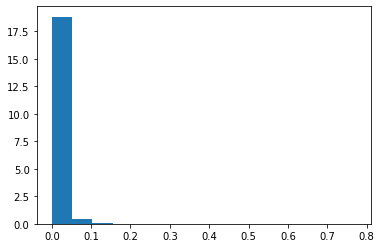

In [ ]:
plt.hist(data_returns.var(), density = True, bins = 15)

(array([ 0.,  0.,  0.,  0.,  0.,  0.,  0., 15.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.]),
 array([0.5       , 0.56666667, 0.63333333, 0.7       , 0.76666667,
        0.83333333, 0.9       , 0.96666667, 1.03333333, 1.1       ,
        1.16666667, 1.23333333, 1.3       , 1.36666667, 1.43333333,
        1.5       ]),
 <a list of 15 Patch objects>)

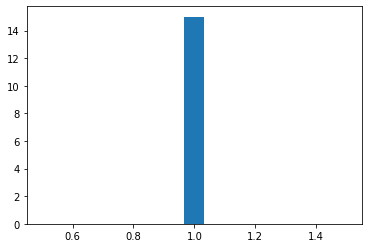

In [ ]:
data_returns_st = StandardScaler().fit_transform(data_returns)
plt.hist(data_returns_st.var(), density = True, bins = 15)

In [ ]:
data_returns_pca = PCA().fit_transform(data_returns_st)

In [ ]:
data_returns_pca = pd.DataFrame(data_returns_pca)
data_returns_pca

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325
0,11.551103,2.121157,7.146351,-2.577280,0.419432,0.085198,-2.509279,-0.984869,1.061580,1.304933,0.196488,-0.571604,-1.881682,-0.372435,0.726495,0.217918,-1.103438,2.754179,1.347545,1.857905,-2.595043,1.110313,-3.401060,1.497469,0.135751,1.179545,3.746637,2.662735,1.906212,0.272735,1.320809,-1.254012,2.760221,-1.313532,1.763148,-0.164082,1.282596,-0.454171,2.496595,-3.133889,0.287557,0.803436,-0.226473,-0.623204,-0.184096,-0.879735,-1.848756,0.775512,-2.447369,-0.928841,2.012167,-2.616293,1.404495,-2.335853,2.632393,-0.432734,4.745529,0.666363,0.717994,2.318899,2.033261,-0.462145,1.955799,-0.009991,-0.274081,0.252807,-1.037781,0.765416,0.304862,2.533330,0.680860,2.904015,1.981576,-1.841196,2.307586,1.481576,-0.371483,-3.473915,-0.197742,-2.647133,-0.544093,2.198837,-2.187512,1.657998,-4.124658,-2.621862,2.404399,-0.303735,-4.081092,-1.082767,-1.883632,0.397944,-4.474548,-0.877159,-3.827442,1.878959,3.084993,0.592085,2.147676,-0.061461,-0.083710,0.866180,6.731227,3.079473,-3.532706,0.812699,1.353016,3.383864,1.871693,0.264363,-0.378867,-3.372569,-3.319516,3.239018,2.802932,0.269002,9.160563,-2.221940,0.998169,6.025228,-0.100839,-6.985684,-4.601823,12.824133,0.014670,2.628523,10.943256,3.670752,-11.133603,0.746934,1.622840,9.038240,4.802291,-7.281583,-1.386743,3.084353,-0.121926,2.726856,1.849666,-0.414953,5.289906,1.946157,7.202263,-3.830272,2.080180,-5.735448,2.360702,3.888265,1.171209,-3.521561,19.250127,-0.986440,5.453244,1.162275,1.877271,-0.253724,-2.623915,1.486629,0.512950,-1.600200,-1.367832,4.255559,7.603487,3.435093,-4.024287,-2.580443,-7.414580,-0.353269,-0.591810,-1.627820,-12.671404,0.897560,-4.531344,-13.555390,11.121207,17.664787,14.846853,-7.367942,2.115789,-8.129452,30.661860,20.711116,-16.387046,-0.671557,-3.103438,12.357489,-7.062910,2.922606,0.201147,-2.212246,-2.322515,3.215063,4.142631,4.355357,1.360952,4.886545,6.369167,-2.865656,0.284433,-5.084910,-1.136056,3.205268,-3.878262,1.097226,2.611974,-4.036799,-2.477844,-2.407800,2.405990,-1.159125,7.657421,3.283193,2.554563,3.627741,6.414166,-0.539930,-4.831191,4.455135,0.336228,2.798220,0.912614,-1.740254,1.552355,1.166155,-1.882752,-0.724830,-7.145057,-7.222663,-7.186743,-2.594654,2.927604,-1.528196,0.458721,0.645324,0.125409,-3.863883,0.358571,-0.499530,-0.009847,0.330096,0.960669,0.193281,1.391094,-1.063214,1.213560,-3.475677,-1.442468,-3.483429,-1.612749,0.549175,1.088493,-0.236809,-2.535432,-0.674999,-0.475725,2.349988,-2.780255,-0.419613,0.734079,1.524102,-0.797202,0.074705,-2.528582,-0.669303,-0.580320,-0.568459,-0.446472,-1.714222,0.346307,0.672730,-1.743539,-1.342974,1.691640,-0.435139,-1.818554,0.135926,3.137532,-0.576817,0.569070,1.014946,0.300655,-0.639992,-0.167989,0.397501,0.950327,-1.276332,-0.231351,-1.006117,-0.110688,0.031163,-0.978181,1.064064,-2.026114,-1.049852,0.2019

In [ ]:
pca_out = PCA().fit(data_returns_st)

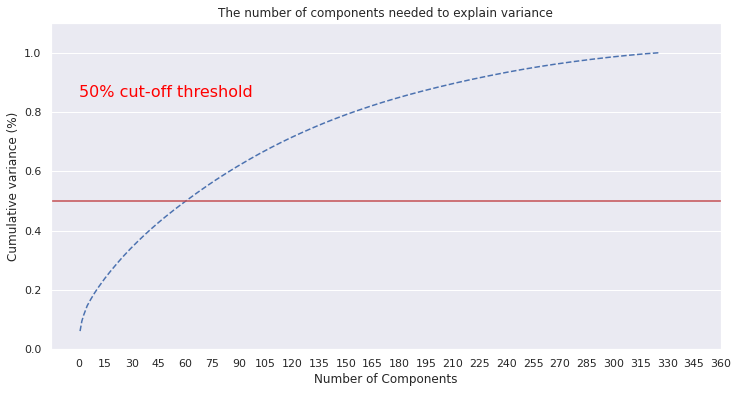

In [ ]:
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, 327, step=1)
y = np.cumsum(pca_out.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 365, step=15))
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.50, color='r', linestyle='-')
plt.text(0.5, 0.85, '50% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

I set the criterion as 50% of the variance explained, about 60 factors are needed to explain 50% of the variance.

In [ ]:
df_returns_pca = pd.DataFrame(data_returns_pca)
pca_select = df_returns_pca.iloc[:, 0:60]
pca_select.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59
0,11.551103,2.121157,7.146351,-2.577280,0.419432,0.085198,-2.509279,-0.984869,1.061580,1.304933,0.196488,-0.571604,-1.881682,-0.372435,0.726495,0.217918,-1.103438,2.754179,1.347545,1.857905,-2.595043,1.110313,-3.401060,1.497469,0.135751,1.179545,3.746637,2.662735,1.906212,0.272735,1.320809,-1.254012,2.760221,-1.313532,1.763148,-0.164082,1.282596,-0.454171,2.496595,-3.133889,0.287557,0.803436,-0.226473,-0.623204,-0.184096,-0.879735,-1.848756,0.775512,-2.447369,-0.928841,2.012167,-2.616293,1.404495,-2.335853,2.632393,-0.432734,4.745529,0.666363,0.717994,2.318899
1,-13.707112,-4.867997,-12.434345,5.522547,-4.087457,-1.013466,4.651095,0.514543,1.384434,1.334457,-0.243157,-2.959644,-0.213573,-1.804800,-2.609801,3.033558,-2.642404,-3.337784,2.781555,-1.306481,-0.338423,-4.354280,3.041221,-3.374483,-0.708009,0.888125,-6.662999,-1.943400,-2.986839,0.187773,-0.981721,-4.289203,0.725416,5.271430,-6.401792,-1.771014,-0.704468,0.193793,-5.789215,2.269646,6.353184,-1.091317,2.055474,-1.212960,3.776498,3.272930,4.331825,-8.046636,-4.451236,0.664648,-3.584776,1.353731,-6.371185,3.505558,-3.135661,2.082781,-1.107906,0.564389,-0.611190,2.424378
2,-13.128727,6.054536,-7.436631,3.139691,3.867029,-5.539851,-1.701547,0.356636,-0.446280,-1.878743,-5.754641,2.798535,-2.634557,-1.577384,-2.609253,3.086744,2.898744,-5.145902,2.994351,-9.563627,1.307371,3.515888,5.776200,-2.310160,-4.696250,-8.610069,-4.950479,-1.579394,-1.553007,-5.617608,-2.083338,6.086266,-7.672396,-2.199204,5.084012,9.044594,3.930567,1.607225,-8.833984,5.616970,-8.328577,-0.559370,-7.693512,-1.434931,-0.815563,-3.212443,10.773120,6.626871,7.452555,1.121822,-0.190297,0.307233,11.551114,2.093491,-7.453126,-6.071354,-6.284319,2.283188,-6.596897,-20.308387
3,-3.932224,1.372332,-2.746641,2.570523,1.097267,-3.782135,-1.432226,-0.643811,-0.865214,0.164385,-1.266991,0.180473,-0.523778,-0.422061,-1.058627,2.572313,1.674179,-0.670242,0.509333,-2.294512,-0.450136,0.685759,2.118781,-1.248303,-0.655580,-1.694831,-1.572016,0.568470,1.514342,-1.319189,-0.085022,0.439610,-1.038132,-0.424088,1.442960,0.523497,0.608318,0.585785,-2.627863,1.004513,-2.304658,-0.926619,-2.233383,-1.472906,-1.005454,-0.389947,3.152884,0.763403,2.274822,1.145133,-0.623349,0.049594,3.535947,-0.093688,-3.293786,-2.069986,-1.375953,0.966875,-0.021183,-3.360465
4,6.767045,0.844668,4.101327,1.096685,0.037782,-0.870666,-1.049952,-0.355077,0.548414,1.099639,-0.176512,-0.909518,-0.100311,0.848251,1.065557,1.155472,1.882257,0.063193,-0.713201,0.883021,-0.900116,0.092922,-1.121924,0.536482,2.028685,-0.446072,2.915353,0.909856,2.629472,-1.326097,-0.513360,-0.171432,-0.168803,-0.927580,0.174071,-1.245498,0.990073,0.022142,0.162918,-0.520487,0.224477,0.432109,-0.010696,-0.094160,0.093802,-1.408199,-1.237057,1.075532,-0.397731,-0.374114,1.569905,-0.057451,1.879556,-0.605782,1.281992,0.515788,2.282521,-0.036681,-0.085699,0.739122


<h4> (b) <h4>

In [ ]:
data_factors = data.iloc[:, 1:17].copy()
data_factors.head()

,MKT,HML,SMB,MOM1,MOM36,ACC,BETA,CFP,CHCSHO,DY,EP,IDIOVOL,CMA,UMD,RMW,RETVOL
0,-0.041264,-0.028083,0.004779,-0.007336,-0.025496,-0.013692,0.035433,-0.015116,-0.006771,-0.001226,0.001586,0.036246,-0.014193,0.012468,-0.005361,0.026900
1,0.107984,-0.022529,-0.027366,0.010963,-0.021188,-0.027887,-0.082499,-0.032122,-0.005893,-0.037563,-0.008621,-0.042074,-0.003394,0.079571,0.032935,-0.029811
2,-0.007668,0.051012,0.085547,0.050916,0.108588,0.021978,-0.072801,0.028117,-0.008193,-0.014228,-0.006754,-0.089817,0.019346,-0.026594,0.005965,-0.076449
3,0.010796,0.070501,0.002794,-0.027398,0.079286,0.003860,-0.024906,0.037363,0.015625,0.022895,0.016494,-0.012679,0.022658,-0.005968,0.017131,-0.021424
4,-0.025367,0.039029,-0.015135,-0.009368,0.024631,0.004612,0.041266,0.037916,0.017117,0.046819,0.032956,0.060565,0.025606,-0.003624,-0.013689,0.027512


Let's check the factors distribution

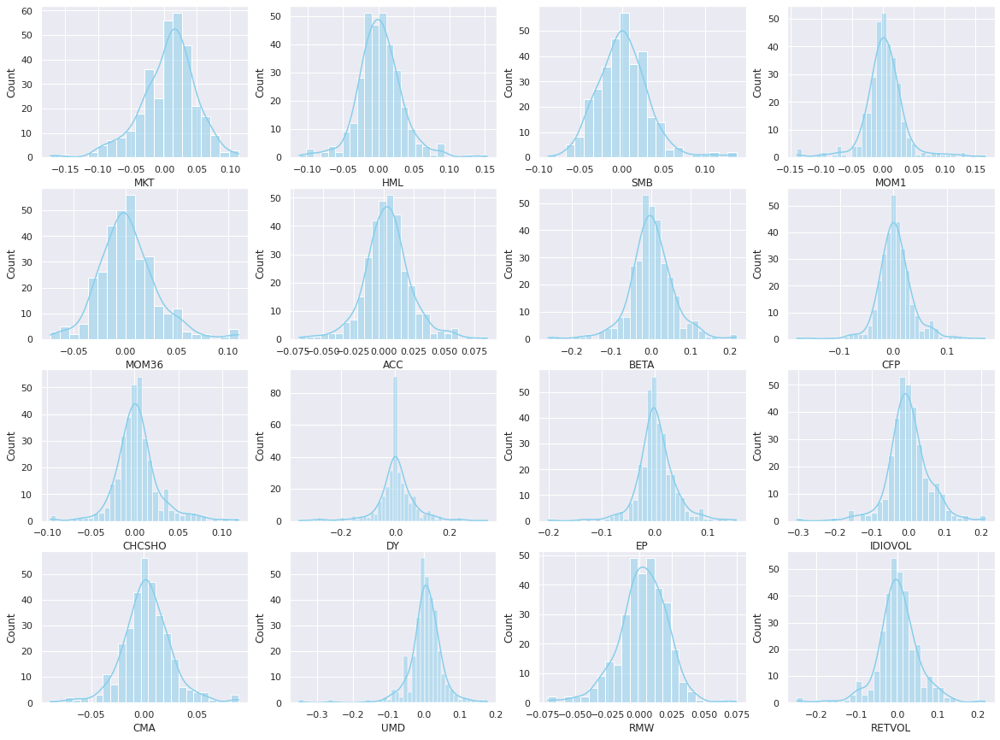

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="darkgrid")
df = sns.load_dataset("iris")

fig, axs = plt.subplots(4, 4, figsize=(20, 15))

sns.histplot(data=data_factors, x="MKT", kde=True, color="skyblue", ax=axs[0, 0])
sns.histplot(data=data_factors, x="HML", kde=True, color="skyblue", ax=axs[0, 1])
sns.histplot(data=data_factors, x="SMB", kde=True, color="skyblue", ax=axs[0, 2])
sns.histplot(data=data_factors, x="MOM1", kde=True, color="skyblue", ax=axs[0, 3])
sns.histplot(data=data_factors, x="MOM36", kde=True, color="skyblue", ax=axs[1, 0])
sns.histplot(data=data_factors, x="ACC", kde=True, color="skyblue", ax=axs[1, 1])
sns.histplot(data=data_factors, x="BETA", kde=True, color="skyblue", ax=axs[1, 2])
sns.histplot(data=data_factors, x="CFP", kde=True, color="skyblue", ax=axs[1, 3])
sns.histplot(data=data_factors, x="CHCSHO", kde=True, color="skyblue", ax=axs[2, 0])
sns.histplot(data=data_factors, x="DY", kde=True, color="skyblue", ax=axs[2, 1])
sns.histplot(data=data_factors, x="EP", kde=True, color="skyblue", ax=axs[2, 2])
sns.histplot(data=data_factors, x="IDIOVOL", kde=True, color="skyblue", ax=axs[2, 3])
sns.histplot(data=data_factors, x="CMA", kde=True, color="skyblue", ax=axs[3, 0])
sns.histplot(data=data_factors, x="UMD", kde=True, color="skyblue", ax=axs[3, 1])
sns.histplot(data=data_factors, x="RMW", kde=True, color="skyblue", ax=axs[3, 2])
sns.histplot(data=data_factors, x="RETVOL", kde=True, color="skyblue", ax=axs[3, 3])

plt.show()

Now, we can regress the selected components on the anomaly factors to see how they relate to each other.

In [ ]:
lista = []

for i in pca_select.columns:
  model_i = sm.OLS(pca_select[i], data_factors)
  results_i = model_i.fit()
  params_i = results_i.params
  pvalues_i = results_i.pvalues.round(2)
  params_i = params_i.tolist()
  pvalues_i = pvalues_i.tolist()
  lista.append(params_i)
  lista.append(pvalues_i)

lista = pd.DataFrame(lista)
lista = lista.transpose()

In [ ]:
df = lista.rename(index = {0: "MKT", 1: "HML", 2: "SMB", 3: "MOM1", 4: "MOM36", 5: "ACC", 6: "BETA", 7: "CFP", 8: "CSCSHO",
                           9: "DY", 10: "EP", 11: "IDIOVOL", 12: "CMA", 13: "UMD", 14: "RMW", 15: "RETVOL"})

df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119
MKT,-386.661591,0.00,-167.855053,0.00,-193.067287,0.00,37.739129,0.05,-26.006341,0.28,32.618943,0.12,22.528933,0.24,23.429315,0.21,40.035743,0.03,-1.719712,0.93,7.496313,0.68,-37.644191,0.03,36.054249,0.04,2.263656,0.90,-45.500604,0.01,-16.728277,0.36,-55.441540,0.00,-3.431336,0.85,26.739290,0.11,16.203987,0.36,0.099489,1.00,-9.750087,0.58,-14.169825,0.42,-3.686496,0.83,10.306015,0.55,-6.810696,0.69,-21.720681,0.19,-0.784272,0.96,1.282240,0.94,9.268977,0.57,3.448495,0.82,-8.204755,0.62,31.362622,0.05,36.563250,0.02,-21.984504,0.17,12.226724,0.45,19.645634,0.20,21.025026,0.17,-19.725172,0.21,-11.157366,0.48,35.531249,0.02,-5.203292,0.74,-12.089820,0.44,10.661771,0.48,8.014651,0.60,12.776897,0.39,14.080265,0.34,-40.758974,0.01,-13.911770,0.35,-28.796787,0.05,-9.683858,0.52,-8.850853,0.54,-18.210348,0.21,15.012585,0.30,-10.094586,0.49,21.236276,0.14,-1.798232,0.90,6.515355,0.65,3.840570,0.79,16.268775,0.25
HML,-118.624893,0.00,105.396278,0.08,-64.023412,0.31,2.560127,0.96,-190.056667,0.00,-79.036562,0.13,-178.709540,0.00,87.146475,0.06,143.433999,0.00,63.345162,0.21,-93.168748,0.04,-39.581935,0.36,-84.647745,0.05,-1.117397,0.98,-50.518151,0.26,-106.856525,0.02,-84.278619,0.05,-0.142447,1.00,10.694618,0.80,-38.221988,0.38,46.842867,0.28,-7.346173,0.86,6.152741,0.89,-149.580390,0.00,140.462062,0.00,-72.060208,0.08,-75.570843,0.06,30.271806,0.47,7.502715,0.86,-41.354626,0.30,30.587562,0.42,-17.987898,0.65,-48.681453,0.22,-49.193366,0.21,4.575159,0.91,-1.152975,0.98,14.414461,0.70,-66.550961,0.08,-66.941752,0.08,-23.553722,0.54,48.781599,0.19,1.763902,0.96,-25.734149,0.50,-31.843660,0.39,51.290176,0.17,-1.380186,0.97,6.453421,0.86,39.783542,0.27,21.577200,0.55,-23.915654,0.51,-17.403263,0.63,-13.730537,0.70,21.899325,0.54,-72.936637,0.04,-73.831624,0.04,81.138990,0.02,-92.097682,0.01,24.239349,0.49,54.508479,0.12,66.210402,0.06
SMB,-273.131523,0.00,-17.806741,0.55,-27.801758,0.38,46.268822,0.05,91.352393,0.00,-10.056432,0.70,-128.442672,0.00,100.753420,0.00,73.643106,0.00,-21.732351,0.39,-36.042429,0.10,104.423253,0.00,7.299446,0.73,19.895103,0.39,-14.943683,0.50,18.123503,0.42,-66.913205,0.00,21.882328,0.33,-41.564061,0.04,64.233184,0.00,0.798489,0.97,45.005465,0.04,-9.182779,0.67,21.837535,0.30,-22.649462,0.28,-50.807721,0.01,44.255165,0.03,-18.870866,0.37,-11.117475,0.59,28.536327,0.15,23.750083,0.21,9.225758,0.64,15.780277,0.43,-20.281422,0.30,52.244391,0.01,8.184271,0.68,79.830750,0.00,67.301301,0.00,-16.336783,0.39,-26.935775,0.16,-14.863343,0.43,-8.900494,0.64,-27.721220,0.15,20.422522,0.27,0.259910,0.99,0.222653,0.99,-17.130997,0.34,7.107123,0.69,-11.454120,0.53,-13.964845,0.44,4.475104,0.81,-10.323635,0.56,-2.130744,0.91,14.897672,0.40,-9.030264,0.61,10.453405,0.56,18.646436,0.28,-23.057981,0.19,-7.127207,0.69,-3.099582,0.86
MOM1,-30.980417,0.00,50.811124,0.01,25.127814,0.23,69.255200,0.00,-19.190768,0.33,-14.016293,0.42,-19.350023,0.22,4.106258,0.79,-21.917225,0.14,-26.868169,0.11,44.594810,0.00,38.304600,0.01,6.345814,0.66,-32.714081,0.03,19.127019,0.20,-14.257978,0.34,-24.643224,0.08,42.256758,0.00,69.643703,0.00,-11.562392,0.43,4.930004,0.73,-23.787830,0.10,-2.904553,0.84,21.782022,0.12,-18.110311,0.19,14.752539,0.28,-9.944284,0.46,-22.344389,0.11,-17.349555,0.21,-18.230863,0.17,30.061352,0.02,10.951501,0.41,-39.872299,0.00,-7.357624,0.57,-1.022059,0.94,3.113923,0.81,9.345970,0.45,8.023956,0.52,6.926001,0.59,12.610412,0.33,21.630172,0.08,-21.455121,0.09,8.025674,0.53,-33.359866,0.01,-22.322139,0.07,-4.380640,0.72,-2.091199,0.86,7.641743,0.52,4.925315,0.68,-4.263314,0.72,-15.207599,0.21,-17.232238,0.15,0.143998,0.99,-10.034705,0.40,-2.669430,0.82,-6.077236,0

In [ ]:
def rename_col(x):
  for col in x.columns:
    float(col)
    if (col%2 != 0):
      x = x.rename(columns = {col: "p-value"})
    else:
      x = x.rename(columns = {col: int(col/2)})
  return x

In [ ]:
df = rename_col(df)

In [ ]:
df

,0,p-value,1,p-value,2,p-value,3,p-value,4,p-value,5,p-value,6,p-value,7,p-value,8,p-value,9,p-value,10,p-value,11,p-value,12,p-value,13,p-value,14,p-value,15,p-value,16,p-value,17,p-value,18,p-value,19,p-value,20,p-value,21,p-value,22,p-value,23,p-value,24,p-value,25,p-value,26,p-value,27,p-value,28,p-value,29,p-value,30,p-value,31,p-value,32,p-value,33,p-value,34,p-value,35,p-value,36,p-value,37,p-value,38,p-value,39,p-value,40,p-value,41,p-value,42,p-value,43,p-value,44,p-value,45,p-value,46,p-value,47,p-value,48,p-value,49,p-value,50,p-value,51,p-value,52,p-value,53,p-value,54,p-value,55,p-value,56,p-value,57,p-value,58,p-value,59,p-value
MKT,-386.661591,0.00,-167.855053,0.00,-193.067287,0.00,37.739129,0.05,-26.006341,0.28,32.618943,0.12,22.528933,0.24,23.429315,0.21,40.035743,0.03,-1.719712,0.93,7.496313,0.68,-37.644191,0.03,36.054249,0.04,2.263656,0.90,-45.500604,0.01,-16.728277,0.36,-55.441540,0.00,-3.431336,0.85,26.739290,0.11,16.203987,0.36,0.099489,1.00,-9.750087,0.58,-14.169825,0.42,-3.686496,0.83,10.306015,0.55,-6.810696,0.69,-21.720681,0.19,-0.784272,0.96,1.282240,0.94,9.268977,0.57,3.448495,0.82,-8.204755,0.62,31.362622,0.05,36.563250,0.02,-21.984504,0.17,12.226724,0.45,19.645634,0.20,21.025026,0.17,-19.725172,0.21,-11.157366,0.48,35.531249,0.02,-5.203292,0.74,-12.089820,0.44,10.661771,0.48,8.014651,0.60,12.776897,0.39,14.080265,0.34,-40.758974,0.01,-13.911770,0.35,-28.796787,0.05,-9.683858,0.52,-8.850853,0.54,-18.210348,0.21,15.012585,0.30,-10.094586,0.49,21.236276,0.14,-1.798232,0.90,6.515355,0.65,3.840570,0.79,16.268775,0.25
HML,-118.624893,0.00,105.396278,0.08,-64.023412,0.31,2.560127,0.96,-190.056667,0.00,-79.036562,0.13,-178.709540,0.00,87.146475,0.06,143.433999,0.00,63.345162,0.21,-93.168748,0.04,-39.581935,0.36,-84.647745,0.05,-1.117397,0.98,-50.518151,0.26,-106.856525,0.02,-84.278619,0.05,-0.142447,1.00,10.694618,0.80,-38.221988,0.38,46.842867,0.28,-7.346173,0.86,6.152741,0.89,-149.580390,0.00,140.462062,0.00,-72.060208,0.08,-75.570843,0.06,30.271806,0.47,7.502715,0.86,-41.354626,0.30,30.587562,0.42,-17.987898,0.65,-48.681453,0.22,-49.193366,0.21,4.575159,0.91,-1.152975,0.98,14.414461,0.70,-66.550961,0.08,-66.941752,0.08,-23.553722,0.54,48.781599,0.19,1.763902,0.96,-25.734149,0.50,-31.843660,0.39,51.290176,0.17,-1.380186,0.97,6.453421,0.86,39.783542,0.27,21.577200,0.55,-23.915654,0.51,-17.403263,0.63,-13.730537,0.70,21.899325,0.54,-72.936637,0.04,-73.831624,0.04,81.138990,0.02,-92.097682,0.01,24.239349,0.49,54.508479,0.12,66.210402,0.06
SMB,-273.131523,0.00,-17.806741,0.55,-27.801758,0.38,46.268822,0.05,91.352393,0.00,-10.056432,0.70,-128.442672,0.00,100.753420,0.00,73.643106,0.00,-21.732351,0.39,-36.042429,0.10,104.423253,0.00,7.299446,0.73,19.895103,0.39,-14.943683,0.50,18.123503,0.42,-66.913205,0.00,21.882328,0.33,-41.564061,0.04,64.233184,0.00,0.798489,0.97,45.005465,0.04,-9.182779,0.67,21.837535,0.30,-22.649462,0.28,-50.807721,0.01,44.255165,0.03,-18.870866,0.37,-11.117475,0.59,28.536327,0.15,23.750083,0.21,9.225758,0.64,15.780277,0.43,-20.281422,0.30,52.244391,0.01,8.184271,0.68,79.830750,0.00,67.301301,0.00,-16.336783,0.39,-26.935775,0.16,-14.863343,0.43,-8.900494,0.64,-27.721220,0.15,20.422522,0.27,0.259910,0.99,0.222653,0.99,-17.130997,0.34,7.107123,0.69,-11.454120,0.53,-13.964845,0.44,4.475104,0.81,-10.323635,0.56,-2.130744,0.91,14.897672,0.40,-9.030264,0.61,10.453405,0.56,18.646436,0.28,-23.057981,0.19,-7.127207,0.69,-3.099582,0.86
MOM1,-30.980417,0.00,50.811124,0.01,25.127814,0.23,69.255200,0.00,-19.190768,0.33,-14.016293,0.42,-19.350023,0.22,4.106258,0.79,-21.917225,0.14,-26.868169,0.11,44.594810,0.00,38.304600,0.01,6.345814,0.66,-32.714081,0.03,19.127019,0.20,-14.257978,0.34,-24.643224,0.08,42.256758,0.00,69.643703,0.00,-11.562392,0.43,4.930004,0.73,-23.787830,0.10,-2.904553,0.84,21.782022,0.12,-18.110311,0.19,14.752539,0.28,-9.944284,0.46,-22.344389,0.11,-17.349555,0.21,-18.230863,0.17,30.061352,0.02,10.951501,0.41,-39.872299,0.00,-7.357624,0.57,-1.022059,0.94,3.113923,0.81,9.345970,0.45,8

We can see that most anomaly factors are statistically significant at 5% to explain the first components, where the coefficients alternate in sign. However, as we analyze the components with lower variance explainability, the coefficients become less significant.
For example, the first 3 components have 5, 7 and 10 statistically significant coefficients, respectively, and the last 3 have only 1, 0 and 1, respectively.

<h4> (c) <h4>

In [ ]:
data_factors

,MKT,HML,SMB,MOM1,MOM36,ACC,BETA,CFP,CHCSHO,DY,EP,IDIOVOL,CMA,UMD,RMW,RETVOL
0,-0.041264,-0.028083,0.004779,-0.007336,-0.025496,-0.013692,0.035433,-0.015116,-0.006771,-0.001226,0.001586,0.036246,-0.014193,0.012468,-0.005361,0.026900
1,0.107984,-0.022529,-0.027366,0.010963,-0.021188,-0.027887,-0.082499,-0.032122,-0.005893,-0.037563,-0.008621,-0.042074,-0.003394,0.079571,0.032935,-0.029811
2,-0.007668,0.051012,0.085547,0.050916,0.108588,0.021978,-0.072801,0.028117,-0.008193,-0.014228,-0.006754,-0.089817,0.019346,-0.026594,0.005965,-0.076449
3,0.010796,0.070501,0.002794,-0.027398,0.079286,0.003860,-0.024906,0.037363,0.015625,0.022895,0.016494,-0.012679,0.022658,-0.005968,0.017131,-0.021424
4,-0.025367,0.039029,-0.015135,-0.009368,0.024631,0.004612,0.041266,0.037916,0.017117,0.046819,0.032956,0.060565,0.025606,-0.003624,-0.013689,0.027512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
321,0.034764,-0.043678,0.013731,0.014853,-0.004026,0.023248,-0.000109,-0.033087,-0.020732,-0.019058,-0.028656,-0.038641,-0.017518,0.048977,0.037510,-0.015509
322,-0.000367,-0.022018,-0.020170,0.002387,0.007886,0.009029,0.023354,0.002636,0.011141,-0.050703,-0.010365,0.012190,-0.002196,0.001102,-0.001261,0.004711
323,-0.076184,0.033774,-0.042549,0.011678,0.010789,-0.033961,0.087205,0.039718,0.047718,0.026241,0.052475,0.073898,0.031974,-0.020262,-0.018420,0.060142
324,0.016938,0.000119,-0.005576,0.009831,-0.022921,-0.015664,0.022115,-0.007698,-0.010318,0.066063,-0.005926,0.052977,-0.004228,-0.013531,0.013160,0.028437


(array([718.39929402, 538.79947052, 538.79947052, 179.59982351,
          0.        , 179.59982351,   0.        , 359.19964701,
        179.59982351,   0.        ,   0.        ,   0.        ,
          0.        ,   0.        , 179.59982351]),
 array([0.00036339, 0.00071138, 0.00105938, 0.00140737, 0.00175537,
        0.00210336, 0.00245136, 0.00279936, 0.00314735, 0.00349535,
        0.00384334, 0.00419134, 0.00453934, 0.00488733, 0.00523533,
        0.00558332]),
 <a list of 15 Patch objects>)

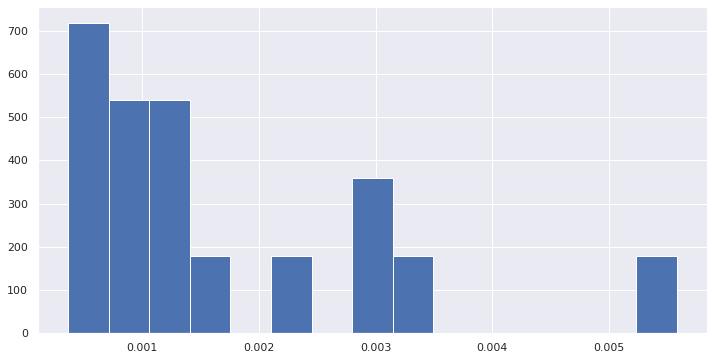

In [ ]:
plt.hist(data_factors.var(), density = True, bins = 15)

In [ ]:
data_factors_st = StandardScaler().fit_transform(data_factors)

(array([ 0.,  0.,  0.,  0.,  0.,  0.,  0., 15.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.]),
 array([0.5       , 0.56666667, 0.63333333, 0.7       , 0.76666667,
        0.83333333, 0.9       , 0.96666667, 1.03333333, 1.1       ,
        1.16666667, 1.23333333, 1.3       , 1.36666667, 1.43333333,
        1.5       ]),
 <a list of 15 Patch objects>)

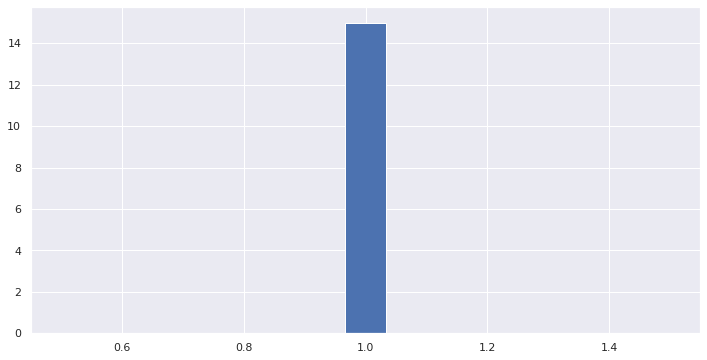

In [ ]:
plt.hist(data_factors_st.var(), density = True, bins = 15)

In [ ]:
data_factors_pca = PCA().fit_transform(data_factors_st)

In [ ]:
df_factors_pca = pd.DataFrame(data_factors_pca)
df_factors_pca

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,-0.278575,-1.601822,0.143716,-0.300417,-0.015232,0.350944,-0.472892,1.572312,0.369216,-0.428603,0.363688,-0.057005,0.259410,0.031309,-0.107523,0.284314
1,1.882063,-0.889769,-1.053161,-0.288439,-1.147152,-0.728408,-2.804799,-2.118080,0.176614,-0.516716,-0.113168,0.357826,-0.207311,-0.052288,0.369957,0.278970
2,1.774228,4.250959,0.541050,-1.051681,-0.000824,2.163537,2.248373,-1.145098,0.099295,-0.394410,-0.738381,-0.384225,0.392971,0.063385,0.078602,-0.308350
3,-1.114813,2.516305,0.694369,-0.471703,1.221529,0.532059,0.459247,-2.021210,-0.350343,-0.549806,-0.836933,-0.552694,-0.080584,-0.351993,-0.063481,-0.069485
4,-2.576986,1.004905,0.576585,0.223140,0.236795,-0.183008,0.551608,0.279922,-0.231589,0.133037,-0.263294,-0.184469,0.245954,-0.249411,-0.219771,0.208797
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
321,2.500487,-1.794759,0.162692,0.089900,-0.571904,0.562243,0.136500,-1.318912,-0.031950,0.213515,0.205385,-0.353648,0.285795,0.102795,-0.195915,-0.223184
322,0.033923,-0.567975,0.288040,-0.180036,-0.070065,-0.440936,0.267288,0.183832,-0.995215,-0.263425,0.438427,0.241050,0.022588,0.380837,-0.252379,0.108182
323,-4.556238,0.433978,-0.335136,-0.395632,-0.178783,0.270373,-0.179617,1.390067,-0.836355,-0.781339,-0.338790,0.483928,-0.075866,0.405433,-0.111205,-0.143551
324,-0.439508,-0.936074,-1.024988,0.742962,-0.043307,0.396297,-0.814156,0.336882,0.302767,-0.078489,0.229992,-0.832717,-0.160238,-0.276235,-0.148134,0.469526


In [ ]:
pca_out_fac = PCA().fit(data_factors_st)

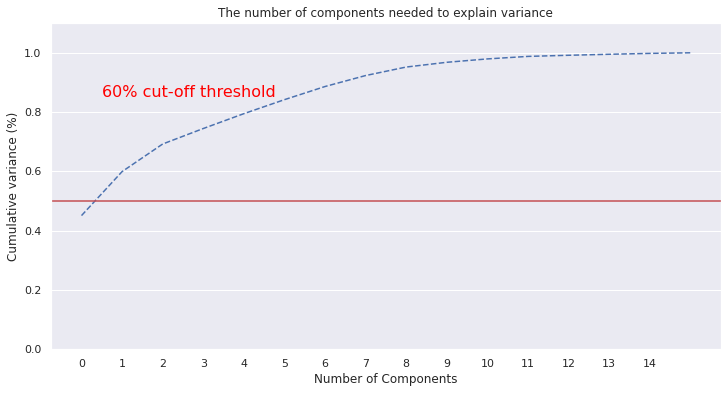

In [ ]:
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(0, 16, step=1)
y = np.cumsum(pca_out_fac.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 15, step=1))
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.50, color='r', linestyle='-')
plt.text(0.5, 0.85, '60% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

In [ ]:
loadings = pca_out_fac.components_
num_pc = pca_out_fac.n_features_
pc_list = ["PC"+str(i) for i in list(range(1, num_pc+1))]
loadings_df = pd.DataFrame.from_dict(dict(zip(pc_list, loadings)))
loadings_df['variable'] = data_factors.columns.values
loadings_df = loadings_df.set_index('variable')
loadings_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16
variable,,,,,,,,,,,,,,,,
MKT,0.222267,0.245759,-0.255643,0.180837,-0.100395,-0.385188,-0.326916,-0.449353,0.036740,0.216150,0.493854,-0.126913,-0.027240,-0.085076,-0.061621,-0.071117
HML,-0.270644,0.372644,-0.074532,-0.126879,0.054234,-0.154793,0.113177,-0.095171,0.199498,-0.058079,-0.387136,-0.349815,-0.431842,-0.422920,-0.064211,-0.180492
SMB,0.234228,0.226922,0.029033,-0.338068,0.041205,0.508505,0.151074,0.120779,0.492539,0.360086,0.318597,-0.040391,-0.033348,-0.065378,-0.000187,0.006774
MOM1,0.082038,0.121816,-0.483660,0.107474,-0.745615,0.165339,0.335881,0.073570,-0.089829,-0.132535,-0.043613,0.036356,-0.018251,0.039227,0.007267,-0.025751
MOM36,-0.031798,0.482677,0.346690,-0.037144,0.043209,0.284184,0.168660,-0.326961,-0.332302,-0.436749,0.205470,-0.136403,0.252721,-0.020291,0.005004,0.012594
ACC,0.220124,-0.097378,0.298691,0.253010,0.033222,-0.225856,0.682911,-0.155313,-0.138344,0.419047,-0.044983,0.067867,0.036695,-0.192138,0.005860,-0.081002
BETA,-0.332480,-0.227725,0.062313,-0.001360,-0.072151,0.063908,0.076473,0.103804,-0.064883,0.082006,0.255220,-0.315336,0.061994,0.192141,-0.578581,-0.506729
CFP,-0.297016,0.198416,-0.141838,-0.079218,0.126307,-0.277560,0.330579,-0.175970,0.301040,0.034424,-0.035172,-0.046241,0.102583,0.627787,-0.047859,0.332660
CHCSHO,-0.345531,0.032609,-0.007381,-0.074999,0.050099,0.094650,0.077252,-0.181401,-0.138738,0.009411,0.269492,0.659678,-0.527846,0.039340,0.010842,-0.126880


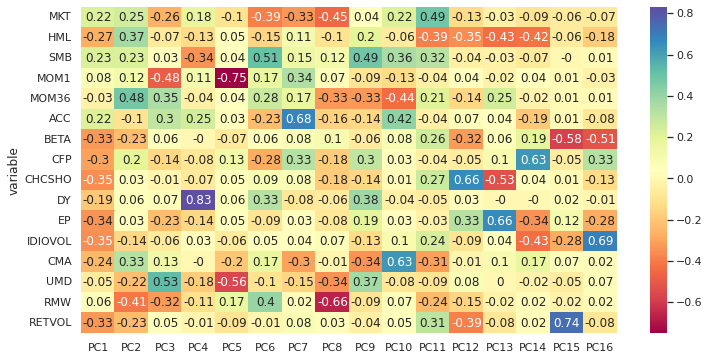

In [ ]:
ax = sns.heatmap(loadings_df.round(2), annot=True, cmap='Spectral')
plt.show()

From the heatmap above, it is visible that most variables are negatively correlated with PC1, with the exception of 4 variables: MKT, SMB, MOM1, ACC.

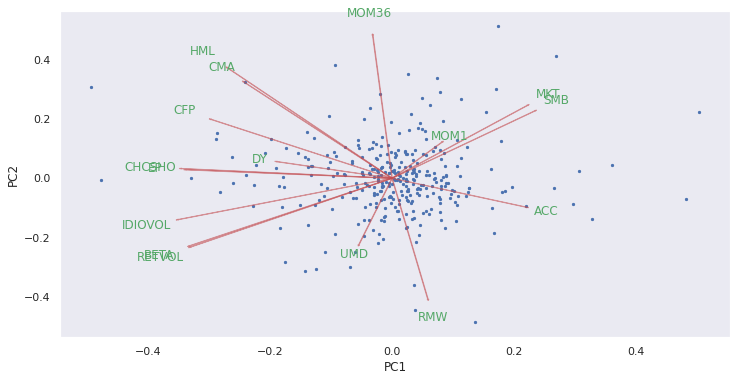

In [ ]:
def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley,s=5)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'green', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
 
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.grid()

myplot(data_factors_pca[:,0:2], np.transpose(pca_out_fac.components_[0:2, :]), list(data_factors.columns))
plt.show()

Even though only the first Principal Component represents the proposed variability, the biplot plot was plotted with 2 PCS due to the feasibility of the visualization. From the biplot plot it is possible to conclude 3 facts:

1- Most variables contribute strongly to PC1, in which the variables HML, CMA, CFP, DY, CHCSHO, EP, IDIOVOL, BETA, RETVOL contribute negatively and the variables MKT, SMB, ACC, MOM1 positively. The rest of the variables UMD, RMW, MOM36 contribute more to PC2.

2- Almost all vectors have a great length, with the exception of the factors MOM1, UMD and DY. This implies that a large variability of the variables is represented by the two PCS plotted on the graph.

3- And finally, the angle between the vectors shows the correlation between the variables. From this, it is possible to observe that the variables HML, CMA, CHCSHO, EP, BETA, RETVOL and MKT, SMB, MOM1 are highly positively correlated. On the other hand, the variables MKT, SMB, MOM1 are negatively correlated with the variables BETA, RETVOL; as well as MOM36 and RMW, and also ACC and CFP, DY.

So, possibly PC1 is a dominant anomaly among the factors.

<h4> d) <h4>

In [ ]:
pca1_factor = data_factors_pca[:, 0].copy()

In [ ]:
pca1_factor_df = pd.DataFrame(pca1_factor)
pca1_factor_df

,0
0,-0.278575
1,1.882063
2,1.774228
3,-1.114813
4,-2.576986
...,...
321,2.500487
322,0.033923
323,-4.556238
324,-0.439508


In [ ]:
model_2 = sm.OLS(pca1_factor_df, pca_select).fit()
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      0   R-squared (uncentered):                   0.909
Model:                            OLS   Adj. R-squared (uncentered):              0.889
Method:                 Least Squares   F-statistic:                              44.50
Date:                Fri, 20 May 2022   Prob (F-statistic):                   1.21e-108
Time:                        19:33:53   Log-Likelihood:                         -393.30
No. Observations:                 326   AIC:                                      906.6
Df Residuals:                     266   BIC:                                      1134.
Df Model:                          60                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
0             -0.0723      0.002    -35.164      0.000      -0.076      -0.068
1              0.0761      0.003     27.363      0.000       0.071       0.082
2              0.0214      0.004      5.940      0.000       0.014       0.029
3             -0.0655      0.004    -16.402      0.000      -0.073      -0.058
4              0.0079      0.004      1.946      0.053   -9.15e-05       0.016
5              0.0175      0.005      3.595      0.000       0.008       0.027
6              0.0353      0.005      7.193      0.000       0.026       0.045
7             -0.0216      0.005     -4.260      0.000      -0.032      -0.012
8             -0.0314      0.005     -6.126      0.000      -0.041      -0.021
9             -0.0285      0.005     -5.428      0.000      -0.039      -0.018
10             0.0303      0.005      5.562      0.000       0.020       0.041
11             0.0020      0.006      0.358      0.721      -0.009       0.013
12            -0.0079      0.006     -1.412      0.159      -0.019       0.003
13            -0.0057      0.006     -1.028      0.305      -0.017       0.005
14            -0.0312      0.006     -5.499      0.000      -0.042      -0.020
15            -0.0050      0.006     -0.860      0.391      -0.016       0.006
16            -0.0022      0.006     -0.373      0.709      -0.014       0.009
17            -0.0015      0.006     -0.255      0.799      -0.013       0.010
18            -0.0094      0.006     -1.579      0.116      -0.021       0.002
19            -0.0225      0.006     -3.743      0.000      -0.034      -0.011
20             0.0267      0.006      4.414      0.000       0.015       0.039
21             0.0131      0.006      2.166      0.031       0.001       0.025
22            -0.0299      0.006     -4.891      0.000      -0.042      -0.018
23             0.0117      0.006      1.894      0.059      -0.000       0.024
24            -0.0157      0.006     -2.529      0.012      -0.028      -0.003
25            -0.0149      0.006     -2.363      0.019      -0.027      -0.002
26            -0.0099      0.006     -1.566      0.118      -0.022       0.003
27             0.0087      0.006      1.369      0.172      -0.004       0.021
28            -0.0139      0.006     -2.156      0.032      -0.027      -0.001
29            -0.0089      0.006     -1.374      0.171      -0.022       0.004
30             0.0234      0.007      3.567      0.000       0.010       0.036
31            -0.0005      0.007     -0.080      0.937      -0.013       0.012
32            -0.0147      0.007     -2.218      0.027      -0.028      -0.002
33             0.0050      0.007      0.756      0.450      -0.008       0.018
34             0.0188      0.007      2.809      0.005       

The table above shows the results for the regression of the PCA of the factors on the PCA's of the returns. All the PCA's of the returns are statistically significant, however, they have coefficients with different signs. This result indicates that the factors generated from the returns are statistically significant to explain the dominant factor generated from all observable market factors.